In [19]:
import os
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
from geopy.distance import geodesic
from sklearn.pipeline import make_pipeline
from sklearn.linear_model import SGDClassifier
from sklearn.preprocessing import StandardScaler
from sklearn.preprocessing import MinMaxScaler
from sklearn.metrics import confusion_matrix, accuracy_score

from category_encoders import TargetEncoder
from sklearn.compose import ColumnTransformer
from sklearn.pipeline import Pipeline
from sklearn.metrics import classification_report
from sklearn.impute import SimpleImputer
from sklearn.model_selection import train_test_split
import joblib

In [2]:
df = pd.read_csv('files/fraud_feature_engineering_example.csv')
df.shape

(1852394, 27)

In [3]:
df['state'].unique()

array(['NC', 'WA', 'ID', 'MT', 'VA', 'PA', 'KS', 'TN', 'IA', 'WV', 'FL',
       'CA', 'NM', 'NJ', 'OK', 'IN', 'MA', 'TX', 'WI', 'MI', 'WY', 'HI',
       'NE', 'OR', 'LA', 'DC', 'KY', 'NY', 'MS', 'UT', 'AL', 'AR', 'MD',
       'GA', 'ME', 'AZ', 'MN', 'OH', 'CO', 'VT', 'MO', 'SC', 'NV', 'IL',
       'NH', 'SD', 'AK', 'ND', 'CT', 'RI', 'DE'], dtype=object)

In [3]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1852394 entries, 0 to 1852393
Data columns (total 27 columns):
 #   Column                        Dtype  
---  ------                        -----  
 0   trans_date_trans_time         object 
 1   cc_num                        int64  
 2   merchant                      object 
 3   category                      object 
 4   amt                           float64
 5   first                         object 
 6   last                          object 
 7   gender                        object 
 8   street                        object 
 9   city                          object 
 10  state                         object 
 11  zip                           int64  
 12  lat                           float64
 13  long                          float64
 14  city_pop                      int64  
 15  job                           object 
 16  dob                           object 
 17  trans_num                     object 
 18  unix_time             

In [4]:
df.head()

,trans_date_trans_time,cc_num,merchant,category,amt,first,last,gender,street,city,...,trans_num,unix_time,merch_lat,merch_long,is_fraud,amt_month,amt_year,amt_month_shopping_net_spend,count_month_shopping_net,first_time_at_merchant
0,2019-01-01 00:00:18,2703186189652095,"fraud_Rippin, Kub and Mann",misc_net,4.97,Jennifer,Banks,F,561 Perry Cove,Moravian Falls,...,0b242abb623afc578575680df30655b9,1325376018,36.011293,-82.048315,0,4.97,4.97,0.0,0.0,True
1,2019-01-01 00:00:44,630423337322,"fraud_Heller, Gutmann and Zieme",grocery_pos,107.23,Stephanie,Gill,F,43039 Riley Greens Suite 393,Orient,...,1f76529f8574734946361c461b024d99,1325376044,49.159047,-118.186462,0,107.23,107.23,0.0,0.0,True
2,2019-01-01 00:00:51,38859492057661,fraud_Lind-Buckridge,entertainment,220.11,Edward,Sanchez,M,594 White Dale Suite 530,Malad City,...,a1a22d70485983eac12b5b88dad1cf95,1325376051,43.150704,-112.154481,0,220.11,220.11,0.0,0.0,True
3,2019-01-01 00:01:16,3534093764340240,"fraud_Kutch, Hermiston and Farrell",gas_transport,45.00,Jeremy,White,M,9443 Cynthia Court Apt. 038,Boulder,...,6b849c168bdad6f867558c3793159a81,1325376076,47.034331,-112.561071,0,45.00,45.00,0.0,0.0,True
4,2019-01-01 00:03:06,375534208663984,fraud_Keeling-Crist,misc_pos,41.96,Tyler,Garcia,M,408 Bradley Rest,Doe Hill,...,a41d7549acf90789359a9aa5346dcb46,1325376186,38.674999,-78.632459,0,41.96,41.96,0.0,0.0,True


In [5]:
df.describe()

,cc_num,amt,zip,lat,long,city_pop,unix_time,merch_lat,merch_long,is_fraud,amt_month,amt_year,amt_month_shopping_net_spend,count_month_shopping_net
count,1.852394e+06,1.852394e+06,1.852394e+06,1.852394e+06,1.852394e+06,1.852394e+06,1.852394e+06,1.852394e+06,1.852394e+06,1.852394e+06,1.852394e+06,1.852394e+06,1.852394e+06,1.852394e+06
mean,4.173860e+17,7.006357e+01,4.881326e+04,3.853931e+01,-9.022783e+01,8.864367e+04,1.358674e+09,3.853898e+01,-9.022794e+01,5.210015e-03,4.153689e+03,4.530560e+04,3.762028e+02,4.567241e+00
std,1.309115e+18,1.592540e+02,2.688185e+04,5.071470e+00,1.374789e+01,3.014876e+05,1.819508e+07,5.105604e+00,1.375969e+01,7.199217e-02,3.909005e+03,3.586752e+04,7.253531e+02,4.575502e+00
min,6.041621e+10,1.000000e+00,1.257000e+03,2.002710e+01,-1.656723e+02,2.300000e+01,1.325376e+09,1.902742e+01,-1.666716e+02,0.000000e+00,1.000000e+00,1.020000e+00,0.000000e+00,0.000000e+00
25%,1.800429e+14,9.640000e+00,2.623700e+04,3.466890e+01,-9.679800e+01,7.410000e+02,1.343017e+09,3.474012e+01,-9.689944e+01,0.000000e+00,1.344790e+03,1.734142e+04,9.020000e+00,1.000000e+00
50%,3.521417e+15,4.745000e+01,4.817400e+04,3.935430e+01,-8.747690e+01,2.443000e+03,1.357089e+09,3.936890e+01,-8.744069e+01,0.000000e+00,3.071990e+03,3.743910e+04,7.589000e+01,3.000000e+00
75%,4.642255e+15,8.310000e+01,7.204200e+04,4.194040e+01,-8.015800e+01,2.032800e+04,1.374581e+09,4.195626e+01,-8.024511e+01,0.000000e+00,5.738470e+03,6.472088e+04,4.259800e+02,7.000000e+00
max,4.992346e+18,2.894890e+04,9.992100e+04,6.669330e+01,-6.795030e+01,2.906700e+06,1.388534e+09,6.751027e+01,-6.695090e+01,1.000000e+00,4.326189e+04,2.190868e+05,1.204718e+04,4.800000e+01


merchant
fraud_Rodriguez Group    3843
fraud_Corwin-Collins     3853
fraud_Cummerata-Jones    3860
fraud_Emard Inc          3867
fraud_Dickinson Ltd      4953
fraud_Boyer PLC          4999
fraud_Kuhn LLC           5031
fraud_Schumm PLC         5195
fraud_Cormier LLC        5246
fraud_Kilback LLC        6262
Name: count, dtype: int64


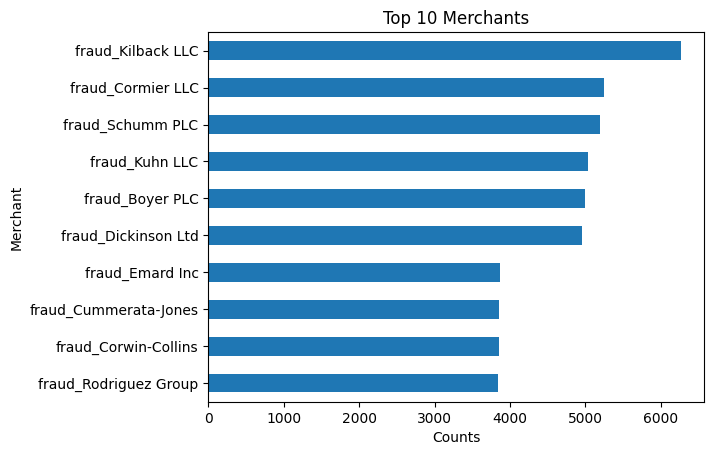

In [6]:
merch_counts = df["merchant"].value_counts().head(10).sort_values()

merch_counts.plot(kind='barh')
plt.xlabel('Counts')
plt.ylabel('Merchant')
plt.title('Top 10 Merchants')
print(merch_counts)
plt.show()

is_fraud
0    1842743
1       9651
Name: count, dtype: int64


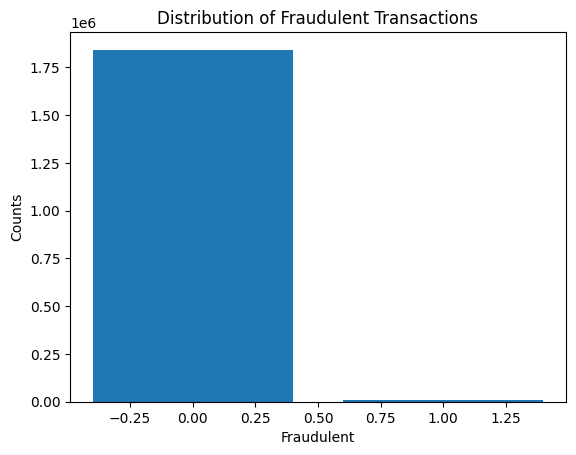

In [7]:
fraud_counts = df["is_fraud"].value_counts()
plt.bar(fraud_counts.index, fraud_counts.values)
plt.xlabel('Fraudulent')
plt.ylabel('Counts')
plt.title('Distribution of Fraudulent Transactions')
print(fraud_counts)
plt.show()

C:\Users\oestr\AppData\Local\Temp\ipykernel_27272\711886060.py:2: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  transaction_counts = df.groupby(pd.Grouper(key='trans_date_trans_time', freq='1M')).size()


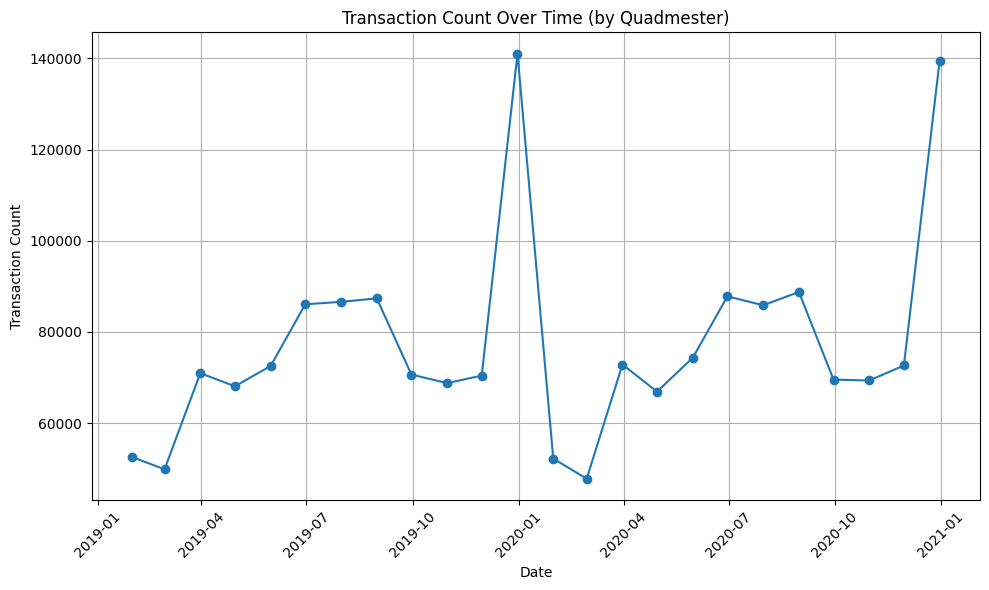

In [8]:
df['trans_date_trans_time'] = pd.to_datetime(df['trans_date_trans_time'])
transaction_counts = df.groupby(pd.Grouper(key='trans_date_trans_time', freq='1M')).size()

plt.figure(figsize=(10, 6))
plt.plot(transaction_counts.index, transaction_counts.values, marker='o', linestyle='-')
plt.xlabel('Date')
plt.ylabel('Transaction Count')
plt.title('Transaction Count Over Time (by Quadmester)')
plt.xticks(rotation=45)  
plt.grid(True)
plt.tight_layout()
plt.show()

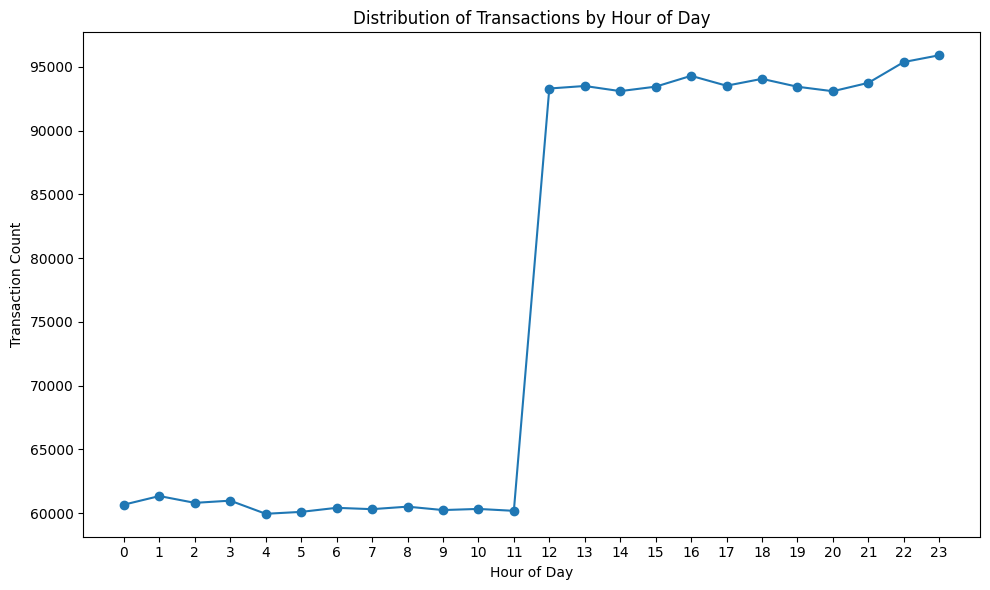

In [9]:
transaction_counts = df['trans_date_trans_time'].dt.hour.value_counts().sort_index()

plt.figure(figsize=(10, 6))
plt.plot(transaction_counts.index, transaction_counts.values, marker='o', linestyle='-')
plt.xlabel('Hour of Day')
plt.ylabel('Transaction Count')
plt.title('Distribution of Transactions by Hour of Day')
plt.xticks(range(0, 24))
plt.tight_layout()
plt.show()

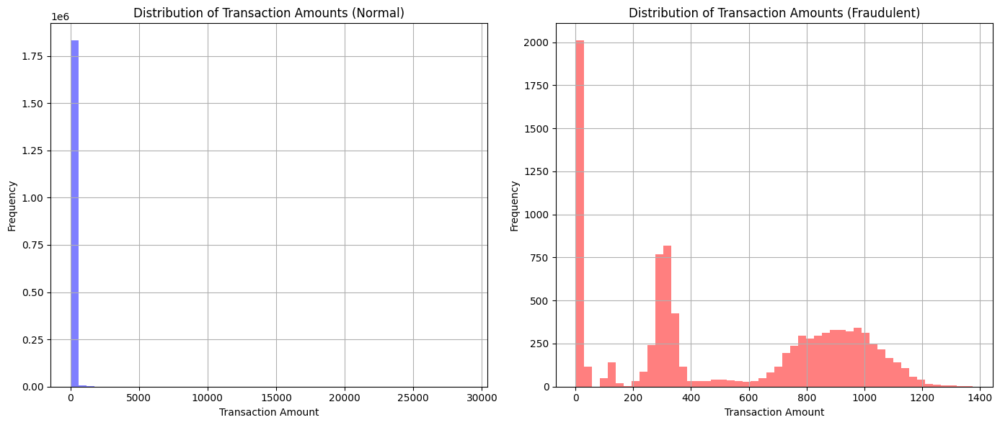

In [10]:
# Histograma para los montos de transacción
fig, axs = plt.subplots(1, 2, figsize=(14, 6))

# Subplot para transacciones normales
axs[0].hist(df[df['is_fraud'] == 0]['amt'], bins=50, color='blue', alpha=0.5)
axs[0].set_xlabel('Transaction Amount')
axs[0].set_ylabel('Frequency')
axs[0].set_title('Distribution of Transaction Amounts (Normal)')
axs[0].grid(True)

# Subplot para transacciones fraudulentas
axs[1].hist(df[df['is_fraud'] == 1]['amt'], bins=50, color='red', alpha=0.5)
axs[1].set_xlabel('Transaction Amount')
axs[1].set_ylabel('Frequency')
axs[1].set_title('Distribution of Transaction Amounts (Fraudulent)')
axs[1].grid(True)

# Ajustar el diseño
plt.tight_layout()
plt.show()

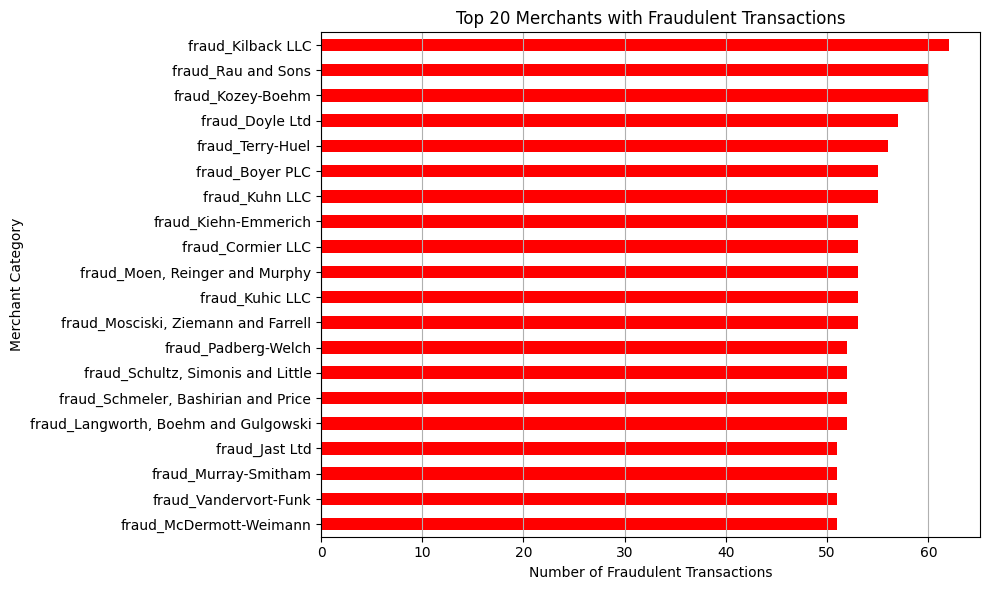

In [11]:
# Distribución de transacciones fraudulentas por categoría de comerciante
top_fraudulent_merchants = df[df['is_fraud'] == 1]['merchant'].value_counts().head(20)

# Crear el gráfico de barras
plt.figure(figsize=(10, 6))
top_fraudulent_merchants.plot(kind='barh', color='red')
plt.xlabel('Number of Fraudulent Transactions')
plt.ylabel('Merchant Category')
plt.title('Top 20 Merchants with Fraudulent Transactions')
plt.gca().invert_yaxis()
plt.grid(axis='x')  
plt.tight_layout()
plt.show()

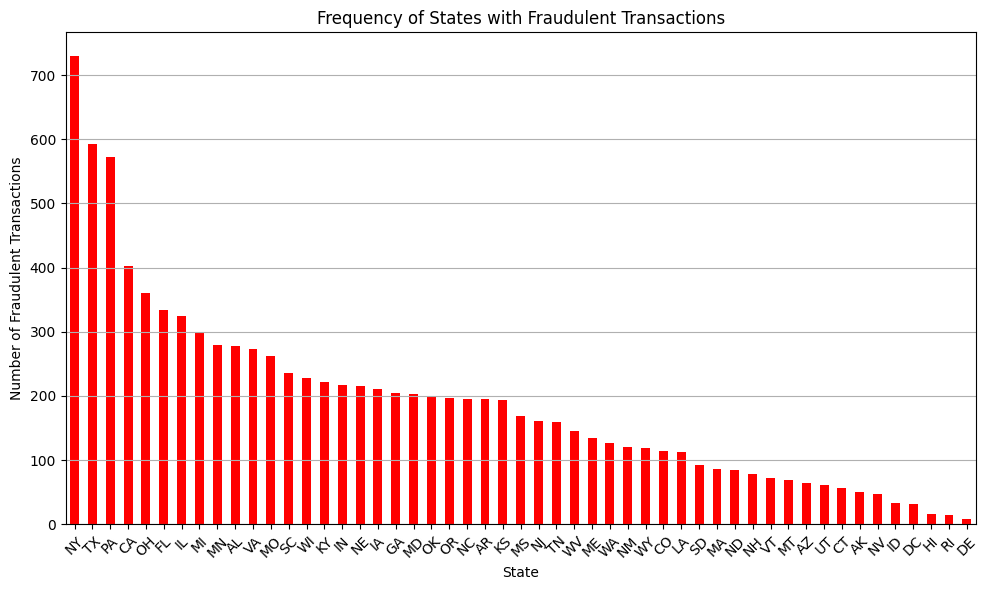

In [12]:
# Distribución de transacciones fraudulentas por estado
fraudulent_state_counts = df[df['is_fraud'] == 1]['state'].value_counts().head(51)

plt.figure(figsize=(10, 6))
fraudulent_state_counts.plot(kind='bar', color='red')
plt.xlabel('State')
plt.ylabel('Number of Fraudulent Transactions')
plt.title('Frequency of States with Fraudulent Transactions')
plt.xticks(rotation=45)
plt.grid(axis='y')
plt.tight_layout()
plt.show()

## Data Splitting and Feature Engineering

### Variables temporales

In [4]:
# Convertir la columna 'trans_date_trans_time' a tipo datetime
df['trans_date_trans_time'] = pd.to_datetime(df['trans_date_trans_time'])

# Agregar características temporales
df['hour_of_day'] = df['trans_date_trans_time'].dt.hour
df['day_of_week'] = df['trans_date_trans_time'].dt.dayofweek
df['month'] = df['trans_date_trans_time'].dt.month
df['year'] = df['trans_date_trans_time'].dt.year

# Definir las estaciones del año
def get_season(month):
    if month in [3, 4, 5]:
        return 'Spring'
    elif month in [6, 7, 8]:
        return 'Summer'
    elif month in [9, 10, 11]:
        return 'Autumn'
    else:
        return 'Winter'

df['season'] = df['month'].apply(get_season)

In [5]:
# Calcular la antigüedad de la cuenta del titular en años
df['age_of_account'] = (pd.to_datetime('now') - pd.to_datetime(df['dob'])).dt.days // 365
df.head()

,trans_date_trans_time,cc_num,merchant,category,amt,first,last,gender,street,city,...,amt_year,amt_month_shopping_net_spend,count_month_shopping_net,first_time_at_merchant,hour_of_day,day_of_week,month,year,season,age_of_account
0,2019-01-01 00:00:18,2703186189652095,"fraud_Rippin, Kub and Mann",misc_net,4.97,Jennifer,Banks,F,561 Perry Cove,Moravian Falls,...,4.97,0.0,0.0,True,0,1,1,2019,Winter,36
1,2019-01-01 00:00:44,630423337322,"fraud_Heller, Gutmann and Zieme",grocery_pos,107.23,Stephanie,Gill,F,43039 Riley Greens Suite 393,Orient,...,107.23,0.0,0.0,True,0,1,1,2019,Winter,45
2,2019-01-01 00:00:51,38859492057661,fraud_Lind-Buckridge,entertainment,220.11,Edward,Sanchez,M,594 White Dale Suite 530,Malad City,...,220.11,0.0,0.0,True,0,1,1,2019,Winter,62
3,2019-01-01 00:01:16,3534093764340240,"fraud_Kutch, Hermiston and Farrell",gas_transport,45.00,Jeremy,White,M,9443 Cynthia Court Apt. 038,Boulder,...,45.00,0.0,0.0,True,0,1,1,2019,Winter,57
4,2019-01-01 00:03:06,375534208663984,fraud_Keeling-Crist,misc_pos,41.96,Tyler,Garcia,M,408 Bradley Rest,Doe Hill,...,41.96,0.0,0.0,True,0,1,1,2019,Winter,38


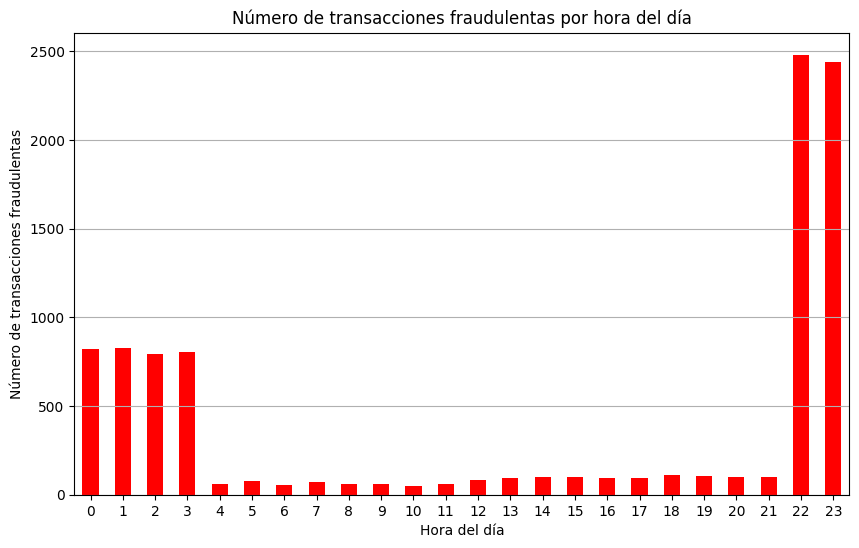

In [6]:
# Filtrar el DataFrame para obtener solo las transacciones fraudulentas
fraudulent_transactions = df[df['is_fraud'] == 1]

# Contar el número de transacciones fraudulentas por hora del día
fraudulent_transactions_by_hour = fraudulent_transactions.groupby('hour_of_day').size()

# Graficar el número de transacciones fraudulentas por hora del día
plt.figure(figsize=(10, 6))
fraudulent_transactions_by_hour.plot(kind='bar', color='red')
plt.title('Número de transacciones fraudulentas por hora del día')
plt.xlabel('Hora del día')
plt.ylabel('Número de transacciones fraudulentas')
plt.xticks(rotation=0)
plt.grid(axis='y')
plt.show()

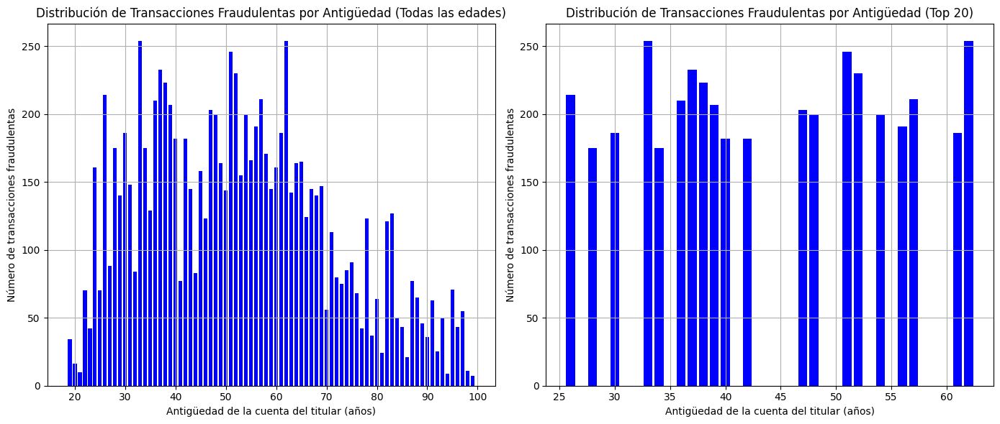

In [7]:
# Contar el número de transacciones fraudulentas por antigüedad de la cuenta del titular
fraudulent_transactions_by_age = fraudulent_transactions.groupby('age_of_account').size()

# Obtener las 20 primeras categorías con más transacciones fraudulentas
top_20_fraudulent_transactions_by_age = fraudulent_transactions_by_age.nlargest(20)

# Histogramas para la antigüedad de la cuenta del titular
fig, axs = plt.subplots(1, 2, figsize=(14, 6))

# Subplot para todas las edades
axs[0].bar(fraudulent_transactions_by_age.index, fraudulent_transactions_by_age, color='blue')
axs[0].set_xlabel('Antigüedad de la cuenta del titular (años)')
axs[0].set_ylabel('Número de transacciones fraudulentas')
axs[0].set_title('Distribución de Transacciones Fraudulentas por Antigüedad (Todas las edades)')
axs[0].grid(True)

# Subplot para las 20 primeras edades
axs[1].bar(top_20_fraudulent_transactions_by_age.index, top_20_fraudulent_transactions_by_age, color='blue')
axs[1].set_xlabel('Antigüedad de la cuenta del titular (años)')
axs[1].set_ylabel('Número de transacciones fraudulentas')
axs[1].set_title('Distribución de Transacciones Fraudulentas por Antigüedad (Top 20)')
axs[1].grid(True)

# Ajustar el diseño
plt.tight_layout()
plt.show()

In [8]:
# Normalizar el monto de la transacción con respecto a la población de la ciudad
df['normalized_amt'] = df['amt'] / df['city_pop']

# Calcular la media, máxima y mínima de transacciones anteriores del mismo titular de la tarjeta
df['mean_amt_previous'] = df.groupby('cc_num')['amt'].transform(lambda x: x.shift().expanding().mean())
df['max_amt_previous'] = df.groupby('cc_num')['amt'].transform(lambda x: x.shift().expanding().max())
df['min_amt_previous'] = df.groupby('cc_num')['amt'].transform(lambda x: x.shift().expanding().min())

# Calcular la diferencia entre el monto de la transacción actual y la media, máxima y mínima de transacciones anteriores
df['diff_from_mean'] = df['amt'] - df['mean_amt_previous']
df['diff_from_max'] = df['amt'] - df['max_amt_previous']
df['diff_from_min'] = df['amt'] - df['min_amt_previous']

# Visualizar las primeras filas del DataFrame con las nuevas características
df.head()

,trans_date_trans_time,cc_num,merchant,category,amt,first,last,gender,street,city,...,year,season,age_of_account,normalized_amt,mean_amt_previous,max_amt_previous,min_amt_previous,diff_from_mean,diff_from_max,diff_from_min
0,2019-01-01 00:00:18,2703186189652095,"fraud_Rippin, Kub and Mann",misc_net,4.97,Jennifer,Banks,F,561 Perry Cove,Moravian Falls,...,2019,Winter,36,0.001422,NaN,NaN,NaN,NaN,NaN,NaN
1,2019-01-01 00:00:44,630423337322,"fraud_Heller, Gutmann and Zieme",grocery_pos,107.23,Stephanie,Gill,F,43039 Riley Greens Suite 393,Orient,...,2019,Winter,45,0.719664,NaN,NaN,NaN,NaN,NaN,NaN
2,2019-01-01 00:00:51,38859492057661,fraud_Lind-Buckridge,entertainment,220.11,Edward,Sanchez,M,594 White Dale Suite 530,Malad City,...,2019,Winter,62,0.052987,NaN,NaN,NaN,NaN,NaN,NaN
3,2019-01-01 00:01:16,3534093764340240,"fraud_Kutch, Hermiston and Farrell",gas_transport,45.00,Jeremy,White,M,9443 Cynthia Court Apt. 038,Boulder,...,2019,Winter,57,0.023208,NaN,NaN,NaN,NaN,NaN,NaN
4,2019-01-01 00:03:06,375534208663984,fraud_Keeling-Crist,misc_pos,41.96,Tyler,Garcia,M,408 Bradley Rest,Doe Hill,...,2019,Winter,38,0.423838,NaN,NaN,NaN,NaN,NaN,NaN


### Características relacionadas con el monto de la transacción

In [9]:
# Obtener las columnas categóricas restantes
categorical_columns = ['merchant', 'category', 'gender', 'job', 'first_time_at_merchant']

# Codificación one-hot para las variables categóricas
df = pd.get_dummies(df, columns=categorical_columns)

# Crear el objeto MinMaxScaler
scaler = MinMaxScaler()

# Lista de columnas numéricas que quieres normalizar
numeric_columns = ['amt', 'city_pop', 'unix_time', 'amt_month', 'amt_year', 'amt_month_shopping_net_spend', 'count_month_shopping_net']

# Normalizar las columnas numéricas
df[numeric_columns] = scaler.fit_transform(df[numeric_columns])
df.head()

,trans_date_trans_time,cc_num,amt,first,last,street,city,state,zip,lat,...,job_Warden/ranger,job_Warehouse manager,job_Waste management officer,job_Water engineer,job_Water quality scientist,job_Web designer,job_Wellsite geologist,job_Writer,first_time_at_merchant_False,first_time_at_merchant_True
0,2019-01-01 00:00:18,2703186189652095,0.000137,Jennifer,Banks,561 Perry Cove,Moravian Falls,NC,28654,36.0788,...,False,False,False,False,False,False,False,False,False,True
1,2019-01-01 00:00:44,630423337322,0.003670,Stephanie,Gill,43039 Riley Greens Suite 393,Orient,WA,99160,48.8878,...,False,False,False,False,False,False,False,False,False,True
2,2019-01-01 00:00:51,38859492057661,0.007569,Edward,Sanchez,594 White Dale Suite 530,Malad City,ID,83252,42.1808,...,False,False,False,False,False,False,False,False,False,True
3,2019-01-01 00:01:16,3534093764340240,0.001520,Jeremy,White,9443 Cynthia Court Apt. 038,Boulder,MT,59632,46.2306,...,False,False,False,False,False,False,False,False,False,True
4,2019-01-01 00:03:06,375534208663984,0.001415,Tyler,Garcia,408 Bradley Rest,Doe Hill,VA,24433,38.4207,...,False,False,False,False,False,False,False,False,False,True


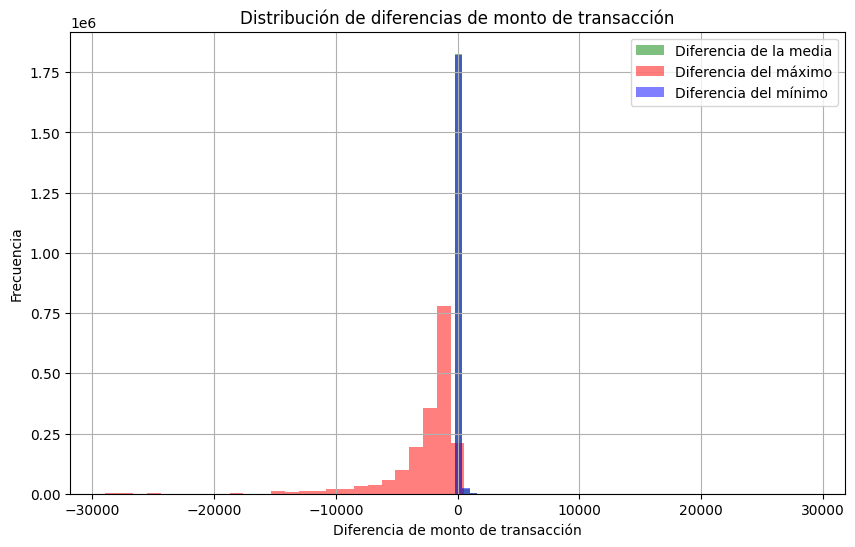

In [10]:
# Graficar la diferencia entre el monto de la transacción actual y la media, máxima y mínima de transacciones anteriores
plt.figure(figsize=(10, 6))
plt.hist(df['diff_from_mean'], bins=50, color='green', alpha=0.5, label='Diferencia de la media')
plt.hist(df['diff_from_max'], bins=50, color='red', alpha=0.5, label='Diferencia del máximo')
plt.hist(df['diff_from_min'], bins=50, color='blue', alpha=0.5, label='Diferencia del mínimo')
plt.xlabel('Diferencia de monto de transacción')
plt.ylabel('Frecuencia')
plt.title('Distribución de diferencias de monto de transacción')
plt.legend()
plt.grid(True)
plt.show()

### Características de ubicación

In [11]:
# Calcular la distancia entre las ubicaciones del titular de la tarjeta y el comerciante
df['dist_client_merch'] = df.apply(lambda row: geodesic((row['lat'], row['long']), (row['merch_lat'], row['merch_long'])).kilometers, axis=1)

# Visualizar las primeras filas del DataFrame con la distancia calculada
df[['lat', 'long', 'merch_lat', 'merch_long', 'dist_client_merch']].head()

,lat,long,merch_lat,merch_long,dist_client_merch
0,36.0788,-81.1781,36.011293,-82.048315,78.773821
1,48.8878,-118.2105,49.159047,-118.186462,30.216618
2,42.1808,-112.2620,43.150704,-112.154481,108.102912
3,46.2306,-112.1138,47.034331,-112.561071,95.685115
4,38.4207,-79.4629,38.674999,-78.632459,77.702395


In [12]:
# Ordenar el DataFrame por número de tarjeta y fecha/hora de la transacción
df_sorted = df.sort_values(by=['cc_num', 'trans_date_trans_time'])

# Inicializar la lista para almacenar las distancias
dist_last_purchase = []

# Variables para almacenar la última posición
prev_lat, prev_lon, prev_cc_num = None, None, None

# Iterar sobre las filas del DataFrame ordenado
for index, row in df_sorted.iterrows():
    if row['cc_num'] == prev_cc_num:
        # Calcular la distancia desde la última transacción del mismo titular de la tarjeta
        distance = geodesic((prev_lat, prev_lon), (row['lat'], row['long'])).kilometers
        dist_last_purchase.append(distance)
    else:
        # Si es la primera transacción del titular de la tarjeta, la distancia es 0
        dist_last_purchase.append(0)
    # Actualizar la última posición
    prev_lat, prev_lon, prev_cc_num = row['lat'], row['long'], row['cc_num']

# Agregar la distancia como una nueva característica al DataFrame
df_sorted['dist_last_purchase'] = dist_last_purchase

# Visualizar las primeras filas del DataFrame con la distancia calculada
df_sorted[['trans_date_trans_time', 'cc_num', 'lat', 'long', 'dist_last_purchase']].head()

,trans_date_trans_time,cc_num,lat,long,dist_last_purchase
1017,2019-01-01 12:47:15,60416207185,43.0048,-108.8964,0.0
2724,2019-01-02 08:44:57,60416207185,43.0048,-108.8964,0.0
2726,2019-01-02 08:47:36,60416207185,43.0048,-108.8964,0.0
2882,2019-01-02 12:38:14,60416207185,43.0048,-108.8964,0.0
2907,2019-01-02 13:10:46,60416207185,43.0048,-108.8964,0.0


## Partir el dataset

In [13]:
# Eliminar las columnas no relevantes
columns_to_drop = ['trans_date_trans_time', 'dob', 'trans_num', 'cc_num', 'first', 'last', 'street', 'city', 'zip']
df_sorted.drop(columns=columns_to_drop, inplace=True)
df_sorted.head()

,amt,state,lat,long,city_pop,unix_time,merch_lat,merch_long,is_fraud,amt_month,...,job_Waste management officer,job_Water engineer,job_Water quality scientist,job_Web designer,job_Wellsite geologist,job_Writer,first_time_at_merchant_False,first_time_at_merchant_True,dist_client_merch,dist_last_purchase
1017,0.000217,WY,43.0048,-108.8964,0.000558,0.000729,43.974711,-109.741904,0,0.000145,...,False,False,False,False,False,False,False,True,127.629296,0.0
2724,0.001794,WY,43.0048,-108.8964,0.000558,0.001866,42.018766,-109.044172,0,0.001369,...,False,False,False,False,False,False,False,True,110.202992,0.0
2726,0.002801,WY,43.0048,-108.8964,0.000558,0.001869,42.961335,-109.157564,0,0.003266,...,False,False,False,False,False,False,False,True,21.841827,0.0
2882,0.001167,WY,43.0048,-108.8964,0.000558,0.002088,42.228227,-108.747683,0,0.004070,...,False,False,False,False,False,False,False,True,87.124420,0.0
2907,0.000904,WY,43.0048,-108.8964,0.000558,0.002119,43.321745,-108.091143,0,0.004698,...,False,False,False,False,False,False,False,True,74.352876,0.0


In [14]:
df_sorted = df_sorted.sort_values(by=['year', 'month', 'day_of_week', 'hour_of_day'])

# Dividir el DataFrame en conjuntos de entrenamiento, desarrollo y prueba
train_df, temp_df = train_test_split(df_sorted, test_size=0.4, random_state=42)
dev_df, test_df = train_test_split(temp_df, test_size=0.5, random_state=42)

# Guardar los conjuntos en archivos CSV
train_df.to_csv('files/fraud_feature_train.csv', index=False)
dev_df.to_csv('files/fraud_feature_dev.csv', index=False)
test_df.to_csv('files/fraud_feature_test.csv', index=False)

print(f"Train set size: {len(train_df)}")
print(f"Dev set size: {len(dev_df)}")
print(f"Test set size: {len(test_df)}")

Train set size: 1111436
Dev set size: 370479
Test set size: 370479


In [24]:
df_sorted.describe()

,amt,lat,long,city_pop,unix_time,merch_lat,merch_long,is_fraud,amt_month,amt_year,...,age_of_account,normalized_amt,mean_amt_previous,max_amt_previous,min_amt_previous,diff_from_mean,diff_from_max,diff_from_min,dist_client_merch,dist_last_purchase
count,1.852394e+06,1.852394e+06,1.852394e+06,1.852394e+06,1.852394e+06,1.852394e+06,1.852394e+06,1.852394e+06,1.852394e+06,1.852394e+06,...,1.852394e+06,1.852394e+06,1.851395e+06,1.851395e+06,1.851395e+06,1.851395e+06,1.851395e+06,1.851395e+06,1.852394e+06,1852394.0
mean,2.385789e-03,3.853931e+01,-9.022783e+01,3.048866e-02,5.272177e-01,3.853898e+01,-9.022794e+01,5.210015e-03,9.599176e-02,2.067892e-01,...,5.011849e+01,1.039940e-01,7.028844e+01,2.657446e+03,2.734007e+00,-2.382726e-01,-2.587396e+03,6.731616e+01,7.610956e+01,0.0
std,5.501400e-03,5.071470e+00,1.374789e+01,1.037224e-01,2.880867e-01,5.105604e+00,1.375969e+01,7.199217e-02,9.035888e-02,1.637145e-01,...,1.742272e+01,6.638543e-01,1.982252e+01,2.961828e+03,8.231486e+00,1.585153e+02,2.969196e+03,1.590237e+02,2.909273e+01,0.0
min,0.000000e+00,2.002710e+01,-1.656723e+02,0.000000e+00,0.000000e+00,1.902742e+01,-1.666716e+02,0.000000e+00,0.000000e+00,0.000000e+00,...,1.900000e+01,3.440328e-07,1.030000e+00,1.030000e+00,1.000000e+00,-1.430420e+03,-2.894787e+04,-1.430420e+03,2.227351e-02,0.0
25%,2.984672e-04,3.466890e+01,-9.679800e+01,2.470175e-04,2.793107e-01,3.474012e+01,-9.689944e+01,0.000000e+00,3.106247e-02,7.914893e-02,...,3.700000e+01,1.140749e-03,5.862289e+01,1.087530e+03,1.010000e+00,-5.206971e+01,-3.106935e+03,8.510000e+00,5.534198e+01,0.0
50%,1.604607e-03,3.935430e+01,-8.747690e+01,8.325658e-04,5.021238e-01,3.936890e+01,-8.744069e+01,0.000000e+00,7.098768e-02,1.708833e-01,...,4.800000e+01,1.107955e-02,6.491312e+01,1.649720e+03,1.020000e+00,-2.413372e+01,-1.573990e+03,4.410000e+01,7.824823e+01,0.0
75%,2.836130e-03,4.194040e+01,-8.015800e+01,6.985640e-03,7.790809e-01,4.195626e+01,-8.024511e+01,0.000000e+00,1.326249e-01,2.954088e-01,...,6.100000e+01,6.125000e-02,8.362824e+01,3.154710e+03,1.060000e+00,1.300743e+01,-1.008490e+03,7.908000e+01,9.847204e+01,0.0
max,1.000000e+00,6.669330e+01,-6.795030e+01,1.000000e+00,1.000000e+00,6.751027e+01,-6.695090e+01,1.000000e+00,1.000000e+00,1.000000e+00,...,9.900000e+01,3.965603e+02,1.433540e+03,2.894890e+04,1.433540e+03,2.888934e+04,2.780849e+04,2.894780e+04,1.518682e+02,0.0


In [25]:
train_df = train_df.dropna()
print("Columnas del DataFrame:")
train_df.columns

Columnas del DataFrame:


Index(['amt', 'state', 'lat', 'long', 'city_pop', 'unix_time', 'merch_lat',
       'merch_long', 'is_fraud', 'amt_month',
       ...
       'job_Waste management officer', 'job_Water engineer',
       'job_Water quality scientist', 'job_Web designer',
       'job_Wellsite geologist', 'job_Writer', 'first_time_at_merchant_False',
       'first_time_at_merchant_True', 'dist_client_merch',
       'dist_last_purchase'],
      dtype='object', length=1236)

In [2]:
# Cargar los conjuntos desde archivos CSV
train_df = pd.read_csv('files/fraud_feature_train.csv')
dev_df = pd.read_csv('files/fraud_feature_dev.csv')
test_df = pd.read_csv('files/fraud_feature_test.csv')

In [3]:
# Identificar columnas categóricas y numéricas
numerical_cols = [
    'amt', 'lat', 'long', 'city_pop', 'unix_time', 'merch_lat', 
    'merch_long', 'amt_month', 'dist_client_merch', 'dist_last_purchase'
]

# Todas las demás columnas se consideran categóricas
categorical_cols = [col for col in train_df.columns if col not in numerical_cols + ['is_fraud']]

# Verificar las columnas identificadas
print("Columnas categóricas:")
print(categorical_cols)

print("\nColumnas numéricas:")
print(numerical_cols)

Columnas categóricas:
['state', 'amt_year', 'amt_month_shopping_net_spend', 'count_month_shopping_net', 'hour_of_day', 'day_of_week', 'month', 'year', 'season', 'age_of_account', 'normalized_amt', 'mean_amt_previous', 'max_amt_previous', 'min_amt_previous', 'diff_from_mean', 'diff_from_max', 'diff_from_min', 'merchant_fraud_Abbott-Rogahn', 'merchant_fraud_Abbott-Steuber', 'merchant_fraud_Abernathy and Sons', 'merchant_fraud_Abshire PLC', 'merchant_fraud_Adams, Kovacek and Kuhlman', 'merchant_fraud_Adams-Barrows', 'merchant_fraud_Altenwerth, Cartwright and Koss', 'merchant_fraud_Altenwerth-Kilback', 'merchant_fraud_Ankunding LLC', 'merchant_fraud_Ankunding-Carroll', 'merchant_fraud_Armstrong, Walter and Gottlieb', 'merchant_fraud_Auer LLC', 'merchant_fraud_Auer-Mosciski', 'merchant_fraud_Auer-West', 'merchant_fraud_Bahringer Group', 'merchant_fraud_Bahringer, Bergnaum and Quitzon', 'merchant_fraud_Bahringer, Osinski and Block', 'merchant_fraud_Bahringer, Schoen and Corkery', 'merchant_f

In [4]:
# Separar las características (X) y las etiquetas (y)
X_train = train_df.drop(columns=['is_fraud'])
y_train = train_df['is_fraud']

X_dev = dev_df.drop(columns=['is_fraud'])
y_dev = dev_df['is_fraud']

X_test = test_df.drop(columns=['is_fraud'])
y_test = test_df['is_fraud']

print("Dimensiones del conjunto de entrenamiento:", X_train.shape, y_train.shape)
print("Dimensiones del conjunto de desarrollo:", X_dev.shape, y_dev.shape)
print("Dimensiones del conjunto de prueba:", X_test.shape, y_test.shape)

Dimensiones del conjunto de entrenamiento: (1111436, 1235) (1111436,)
Dimensiones del conjunto de desarrollo: (370479, 1235) (370479,)
Dimensiones del conjunto de prueba: (370479, 1235) (370479,)


## Clasificador incremental

In [5]:
# Crear transformadores para datos categóricos y numéricos
categorical_transformer = Pipeline(steps=[
    ('imputer', SimpleImputer(strategy='constant', fill_value='missing')),
    ('encoder', TargetEncoder())
])

numerical_transformer = Pipeline(steps=[
    ('imputer', SimpleImputer(strategy='mean')),
    ('scaler', StandardScaler())
])

# Función personalizada para aplicar el preprocesador con `y`
def fit_transform_with_y(preprocessor, X, y):
    preprocessor.fit(X, y)
    return preprocessor.transform(X)

# Combinar los transformadores en un ColumnTransformer
preprocessor = ColumnTransformer(
    transformers=[
        ('num', numerical_transformer, numerical_cols),
        ('cat', categorical_transformer, categorical_cols)
    ]
)

In [6]:
# Dividir el conjunto de entrenamiento en tres partes por estados
states = X_train['state'].unique()
states_group1 = ['NC', 'WA', 'ID', 'MT', 'VA', 'PA', 'KS', 'TN', 'IA', 'WV']
states_group2 = ['FL', 'CA', 'NM', 'NJ', 'OK', 'IN', 'MA', 'TX', 'WI', 'MI']
states_group3 = ['WY', 'HI', 'NE', 'OR', 'LA', 'DC', 'KY', 'NY', 'MS', 'UT']

In [7]:
X_train_group1 = X_train[X_train['state'].isin(states_group1)]
y_train_group1 = y_train[X_train['state'].isin(states_group1)]
X_dev_group1 = X_dev[X_dev['state'].isin(states_group1)]
y_dev_group1 = y_dev[X_dev['state'].isin(states_group1)]

X_train_group2 = X_train[X_train['state'].isin(states_group2)]
y_train_group2 = y_train[X_train['state'].isin(states_group2)]
X_dev_group2 = X_dev[X_dev['state'].isin(states_group1 + states_group2)]
y_dev_group2 = y_dev[X_dev['state'].isin(states_group1 + states_group2)]

X_train_group3 = X_train[X_train['state'].isin(states_group3)]
y_train_group3 = y_train[X_train['state'].isin(states_group3)]

### Random Forest incremental

In [23]:
# Ajustar y transformar los datos
X_train_group1_preprocessed = fit_transform_with_y(preprocessor, X_train_group1, y_train_group1)
print("Preprocesamiento completado.")

c:\Users\oestr\AppData\Local\Programs\Python\Python312\Lib\site-packages\category_encoders\ordinal.py:198: FutureWarning: Downcasting object dtype arrays on .fillna, .ffill, .bfill is deprecated and will change in a future version. Call result.infer_objects(copy=False) instead. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  X[column] = X[column].astype("object").fillna(np.nan).map(col_mapping)
c:\Users\oestr\AppData\Local\Programs\Python\Python312\Lib\site-packages\category_encoders\ordinal.py:198: FutureWarning: Downcasting object dtype arrays on .fillna, .ffill, .bfill is deprecated and will change in a future version. Call result.infer_objects(copy=False) instead. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  X[column] = X[column].astype("object").fillna(np.nan).map(col_mapping)
c:\Users\oestr\AppData\Local\Programs\Python\Python312\Lib\site-packages\category_encoders\ordinal.py:198: Futur

Preprocesamiento completado.


In [8]:
# Crear un modelo SGDClassifier incremental
incremental_model = SGDClassifier(loss='log_loss', max_iter=1000, tol=1e-3)

In [28]:
# Ajustar el modelo en el primer grupo de entrenamiento
incremental_model.partial_fit(X_train_group1_preprocessed, y_train_group1, classes=[0, 1])

SGDClassifier(loss='log_loss')

In [30]:
# Evaluar el modelo en el conjunto de desarrollo
X_dev_group1_preprocessed = fit_transform_with_y(preprocessor, X_dev_group1, y_dev_group1)

c:\Users\oestr\AppData\Local\Programs\Python\Python312\Lib\site-packages\category_encoders\ordinal.py:198: FutureWarning: Downcasting object dtype arrays on .fillna, .ffill, .bfill is deprecated and will change in a future version. Call result.infer_objects(copy=False) instead. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  X[column] = X[column].astype("object").fillna(np.nan).map(col_mapping)
c:\Users\oestr\AppData\Local\Programs\Python\Python312\Lib\site-packages\category_encoders\ordinal.py:198: FutureWarning: Downcasting object dtype arrays on .fillna, .ffill, .bfill is deprecated and will change in a future version. Call result.infer_objects(copy=False) instead. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  X[column] = X[column].astype("object").fillna(np.nan).map(col_mapping)
c:\Users\oestr\AppData\Local\Programs\Python\Python312\Lib\site-packages\category_encoders\ordinal.py:198: Futur

In [35]:
dev_group1_accuracy = incremental_model.score(X_dev_group1_preprocessed, y_dev_group1)
print(f"Precisión en el conjunto de desarrollo después del primer grupo: {dev_group1_accuracy:.4f}")

Precisión en el conjunto de desarrollo después del primer grupo: 0.9969


In [36]:
joblib.dump(incremental_model, 'incremental_random_forest_model.pkl')

['incremental_random_forest_model.pkl']

In [9]:
incremental_model = joblib.load('incremental_random_forest_model.pkl')
print("Modelo cargado con éxito.")

Modelo cargado con éxito.


In [10]:
# Ajustar y transformar los datos del segundo grupo
X_train_group2_preprocessed = fit_transform_with_y(preprocessor, X_train_group2, y_train_group2)

c:\Users\oestr\AppData\Local\Programs\Python\Python312\Lib\site-packages\category_encoders\ordinal.py:198: FutureWarning: Downcasting object dtype arrays on .fillna, .ffill, .bfill is deprecated and will change in a future version. Call result.infer_objects(copy=False) instead. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  X[column] = X[column].astype("object").fillna(np.nan).map(col_mapping)
c:\Users\oestr\AppData\Local\Programs\Python\Python312\Lib\site-packages\category_encoders\ordinal.py:198: FutureWarning: Downcasting object dtype arrays on .fillna, .ffill, .bfill is deprecated and will change in a future version. Call result.infer_objects(copy=False) instead. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  X[column] = X[column].astype("object").fillna(np.nan).map(col_mapping)
c:\Users\oestr\AppData\Local\Programs\Python\Python312\Lib\site-packages\category_encoders\ordinal.py:198: Futur

In [11]:
X_dev_group2_preprocessed = fit_transform_with_y(preprocessor, X_dev_group2, y_dev_group2)
# Ajustar el modelo en el segundo grupo de entrenamiento
incremental_model.partial_fit(X_train_group2_preprocessed, y_train_group2)

c:\Users\oestr\AppData\Local\Programs\Python\Python312\Lib\site-packages\category_encoders\ordinal.py:198: FutureWarning: Downcasting object dtype arrays on .fillna, .ffill, .bfill is deprecated and will change in a future version. Call result.infer_objects(copy=False) instead. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  X[column] = X[column].astype("object").fillna(np.nan).map(col_mapping)
c:\Users\oestr\AppData\Local\Programs\Python\Python312\Lib\site-packages\category_encoders\ordinal.py:198: FutureWarning: Downcasting object dtype arrays on .fillna, .ffill, .bfill is deprecated and will change in a future version. Call result.infer_objects(copy=False) instead. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  X[column] = X[column].astype("object").fillna(np.nan).map(col_mapping)
c:\Users\oestr\AppData\Local\Programs\Python\Python312\Lib\site-packages\category_encoders\ordinal.py:198: Futur

SGDClassifier(loss='log_loss')

In [15]:
# Evaluar el modelo en el conjunto de desarrollo
dev_group2_accuracy = incremental_model.score(X_dev_group2_preprocessed, y_dev_group2)
print(f"Precisión en el conjunto de desarrollo después del segundo grupo: {dev_group2_accuracy:.4f}")
joblib.dump(incremental_model, 'incremental_random_forest_model2.pkl')

Precisión en el conjunto de desarrollo después del segundo grupo: 0.9963


['incremental_random_forest_model2.pkl']

In [16]:
# Ajustar y transformar los datos del segundo grupo
X_train_group3_preprocessed = fit_transform_with_y(preprocessor, X_train_group3, y_train_group3)

c:\Users\oestr\AppData\Local\Programs\Python\Python312\Lib\site-packages\category_encoders\ordinal.py:198: FutureWarning: Downcasting object dtype arrays on .fillna, .ffill, .bfill is deprecated and will change in a future version. Call result.infer_objects(copy=False) instead. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  X[column] = X[column].astype("object").fillna(np.nan).map(col_mapping)
c:\Users\oestr\AppData\Local\Programs\Python\Python312\Lib\site-packages\category_encoders\ordinal.py:198: FutureWarning: Downcasting object dtype arrays on .fillna, .ffill, .bfill is deprecated and will change in a future version. Call result.infer_objects(copy=False) instead. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  X[column] = X[column].astype("object").fillna(np.nan).map(col_mapping)
c:\Users\oestr\AppData\Local\Programs\Python\Python312\Lib\site-packages\category_encoders\ordinal.py:198: Futur

In [17]:
X_dev_group3_preprocessed = fit_transform_with_y(preprocessor, X_dev, y_dev)
# Ajustar el modelo en el segundo grupo de entrenamiento
incremental_model.partial_fit(X_train_group3_preprocessed, y_train_group3)

c:\Users\oestr\AppData\Local\Programs\Python\Python312\Lib\site-packages\category_encoders\ordinal.py:198: FutureWarning: Downcasting object dtype arrays on .fillna, .ffill, .bfill is deprecated and will change in a future version. Call result.infer_objects(copy=False) instead. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  X[column] = X[column].astype("object").fillna(np.nan).map(col_mapping)
c:\Users\oestr\AppData\Local\Programs\Python\Python312\Lib\site-packages\category_encoders\ordinal.py:198: FutureWarning: Downcasting object dtype arrays on .fillna, .ffill, .bfill is deprecated and will change in a future version. Call result.infer_objects(copy=False) instead. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  X[column] = X[column].astype("object").fillna(np.nan).map(col_mapping)
c:\Users\oestr\AppData\Local\Programs\Python\Python312\Lib\site-packages\category_encoders\ordinal.py:198: Futur

SGDClassifier(loss='log_loss')

In [18]:
# Evaluar el modelo en el conjunto de desarrollo
dev_group3_accuracy = incremental_model.score(X_dev_group3_preprocessed, y_dev)
print(f"Precisión en el conjunto de desarrollo después del ultimo grupo: {dev_group3_accuracy:.4f}")
joblib.dump(incremental_model, 'incremental_random_forest_model3.pkl')

Precisión en el conjunto de desarrollo después del ultimo grupo: 0.9961


['incremental_random_forest_model3.pkl']